<a href="https://colab.research.google.com/github/Tasnia16EEE/Swin-Transformer-Understanding-Key-Features-and-Dataset-Refinement/blob/main/SwinTransformer_Understanding_Key_Features_%26_Dataset_Refinement.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup

In [ ]:
!pip install datasets -qq
!pip install evaluate -qq
!pip install transformers -qq
!pip install huggingface_hub -qq
!pip install lime

In [ ]:
import copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import time
import torch
import torchvision.transforms as transforms
from datasets import load_dataset
from PIL import Image
import requests
from torch import nn, optim
from torchvision import datasets, transforms
from torch.nn import functional as F
from transformers import AutoImageProcessor, AutoModelForImageClassification, SwinModel, SwinForImageClassification

# Loading Imagenet Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
 from huggingface_hub import login
 login(token="your_token")

The token has not been saved to the git credentials helper. Pass `add_to_git_credential=True` in this function directly or `--add-to-git-credential` if using via `huggingface-cli` if you want to set the git credential as well.
Token is valid (permission: write).
Your token has been saved to /root/.cache/huggingface/token
Login successful


In [ ]:
from datasets import load_dataset
dataset = load_dataset("imagenet-1k", split="validation", trust_remote_code=True, streaming=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


In [ ]:
dataset

IterableDataset({
    features: ['image', 'label'],
    n_shards: 1
})

In [ ]:
val_data = list(dataset.take(1000))

In [ ]:
val_data[0]

{'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=408x500>,
 'label': 91}

In [ ]:
# Filter and process the dataset to get only samples with label 895
warplane_dataset = [sample for sample in dataset if sample['label'] == 895]

# Importing Model and Image Processor

In [ ]:
processor = AutoImageProcessor.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")
model = AutoModelForImageClassification.from_pretrained("microsoft/swinv2-tiny-patch4-window8-256")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

preprocessor_config.json:   0%|          | 0.00/240 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.9k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/113M [00:00<?, ?B/s]

# Data Manupulation

In [ ]:
data = warplane_dataset

In [ ]:
for i in range(len(data)):
  image = data[i]['image']
  if image.mode == 'L':
    # Convert grayscale image to RGB
    img_rgb = image.convert('RGB')
    data[i]['image'] = img_rgb

# Data Preparation

In [ ]:
def prepare_data(data, processor, device):
    """
    Prepare the data for inference by extracting and processing images, and obtaining true labels and their names.

    Parameters:
    data (list of dict): List where each dict contains 'image' and 'label'.
    processor (callable): The processor function to prepare inputs for the model.
    device (torch.device): The device (CPU or GPU) to move the inputs to.

    Returns:
    tuple: Contains lists of processed inputs, true labels, true label names, and images.
    """
    index= []
    images = []
    true_labels = []
    true_labels_name = []
    processed_inputs = []

    for item in range(len(data)):
        image = data[item]['image']
        images.append(image)
        true_labels.append(data[item]['label'])
        true_labels_name.append(model.config.id2label[data[item]['label']])

        # Pre Process the image and move inputs to the device
        inputs = processor(images=image, return_tensors='pt').to(device)
        processed_inputs.append(inputs)
        index.append(item)

    return index, images, true_labels, true_labels_name, processed_inputs

# Analyzing Data

## Model Inference

In [ ]:
def infer(model, data, processor, device):
    """
    Perform inference on the dataset using the given model and processor.

    Parameters:
    model (torch.nn.Module): The model to perform inference with.
    data (list of dict): List where each dict contains 'image' and 'label'.
    processor (callable): The processor function to prepare inputs for the model.
    device (torch.device): The device (CPU or GPU) to move the inputs to.

    Returns:
    tuple: Contains lists of true labels, true label names, predicted labels, predicted label names, images, and predictions.
    """
    index, images, true_labels, true_labels_name, processed_inputs = prepare_data(data, processor, device)

    predictions = []
    predicted_labels = []
    predicted_labels_name = []


    model.eval()

    with torch.no_grad():
        for inputs in processed_inputs:
            logits = model(**inputs).logits
            predicted_label = logits.argmax(-1).item()
            predicted_labels.append(predicted_label)
            predictions.append(predicted_label)
            predicted_labels_name.append(model.config.id2label[predicted_label])


    return index, images, true_labels, true_labels_name, predicted_labels, predicted_labels_name, predictions

In [ ]:
Inference = infer(model, data, processor, device)

## Model Performance Evaluation

In [ ]:
references = [[data[i]['label']] for i in range(len(data))]

In [ ]:
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix, classification_report
# Calculate accuracy
accuracy = accuracy_score(references, Inference[7])

# Calculate precision, recall, F1 score
precision, recall, f1, _ = precision_recall_fscore_support(references, Inference[7], average='macro')

# Calculate confusion matrix
cm = confusion_matrix(references, Inference[7])
classification_report = classification_report(references, Inference[7])

In [ ]:
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

Accuracy: 0.811
Precision: 0.7338088445078459
Recall: 0.7370898716119829
F1 Score: 0.7228845413581505


In [ ]:
# Specify the file path for the report
file_path = 'data_report.txt'

# Write the report to a text file
with open(file_path, 'w') as file:
    file.write(classification_report)
    file.write('\n')
    file.write(f"Accuracy: {accuracy} \n")
    file.write(f"Precision: {precision} \n")
    file.write(f"Recall: {recall} \n")
    file.write(f"F1 Score: {f1} \n")
    file.write(f"Confusion Matrix: \n  {cm} \n")

The model classifies 81.1% object class. It indicates almost in 19% images, the objects are not classified correctly. There 1000 classes and interpreting all of these classes is difficult. To simplify the task, we will analyze each class label individually to better identify the target features. First we select a random class lets say Warplane Class: 895

## Data Organization

In [ ]:
# Filter and process the dataset to get only samples with label 895
warplane_dataset = [sample for sample in dataset if sample['label'] == 895]

In [ ]:
import pandas as pd
data = {
    'Dataset Index': Inference[0],
    'Images': Inference[1],
    'True Label': Inference[2],
    'True Label Name': Inference[3],
    'Predicted Label': Inference[4],
    'Predicted Label Name': Inference[5],
}
warplane_dataframe = pd.DataFrame(data)

In [ ]:
warplane_dataframe

,Dataset Index,Images,True Label,True Label Name,Predicted Label,Predicted Label Name
0,0,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
1,1,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
2,2,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
3,3,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
4,4,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
5,5,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",403,"aircraft carrier, carrier, flattop, attack air..."
6,6,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
7,7,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
8,8,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"
9,9,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",895,"warplane, military plane"


# Data Analysis

**Unique Values**

In [ ]:
# Filter rows where values in class_label are similar to predicted_label
unique_values_rows = warplane_dataframe[warplane_dataframe['True Label'] == warplane_dataframe['Predicted Label']]
unique_values_rows.shape

(38, 6)

Among 50 images, in 38 images the warplane class objects are correctly classified.

**Distinct Values**

In [ ]:
# Filter rows where values in class_label are different predicted_label
different_values_rows = warplane_dataframe[warplane_dataframe['True Label'] != warplane_dataframe['Predicted Label']]
different_values_rows

,Dataset Index,Images,True Label,True Label Name,Predicted Label,Predicted Label Name
5,5,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",403,"aircraft carrier, carrier, flattop, attack air..."
10,10,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",908,wing
22,22,<PIL.Image.Image image mode=RGB size=500x394 a...,895,"warplane, military plane",404,airliner
26,26,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",403,"aircraft carrier, carrier, flattop, attack air..."
29,29,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",517,crane
31,31,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",404,airliner
32,32,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",403,"aircraft carrier, carrier, flattop, attack air..."
34,34,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",908,wing
36,36,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",908,wing
43,43,<PIL.JpegImagePlugin.JpegImageFile image mode=...,895,"warplane, military plane",403,"aircraft carrier, carrier, flattop, attack air..."


In [ ]:
different_values_rows.shape

(12, 6)

Among 50 images, in 12 images the warplane class objects are incorrectly classified.

# Data Visualization

### Unique Data Visualization

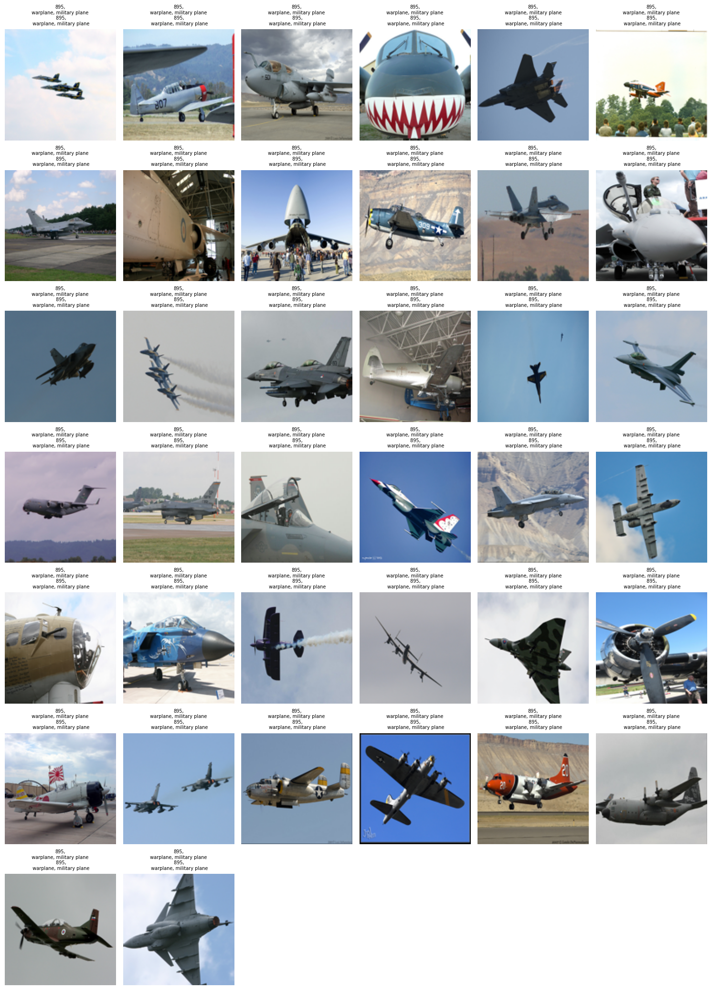

In [ ]:
import matplotlib.pyplot as plt
import math
new_warplane_dataframe = unique_values_rows.iloc[:,:]

# Define the number of images to plot
num_images = len(new_warplane_dataframe)

# Calculate the grid size
num_cols = 6  # Number of columns you want to display
num_rows = math.ceil(num_images / num_cols)

# Set the target size for all images
target_size = (128, 128)  # Width, height

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop over each axis and plot the image, ensuring we don't go out of bounds
for idx, ax in enumerate(axes):
    if idx < len(new_warplane_dataframe):  # Check to avoid index out-of-range
        # Fetch image and resize
        image = new_warplane_dataframe.iloc[idx]['Images']
        image = image.resize(target_size)  # Resize image

        # Fetch labels
        true_label = new_warplane_dataframe.iloc[idx]['True Label']
        true_name = new_warplane_dataframe.iloc[idx]['True Label Name']
        predicted_label = new_warplane_dataframe.iloc[idx]['Predicted Label']
        predicted_label_name = new_warplane_dataframe.iloc[idx]['Predicted Label Name']

        # Display the image with title
        ax.imshow(image)
        ax.set_title(f"{true_label},\n {true_name} \n {predicted_label},\n {predicted_label_name}", fontsize=7)
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any extra subplots

# Adjust spacing between columns
plt.subplots_adjust(wspace=.2, hspace=0.1)
plt.tight_layout()
plt.savefig('unique_data.png')
plt.show()


### Distinct Data Visualization

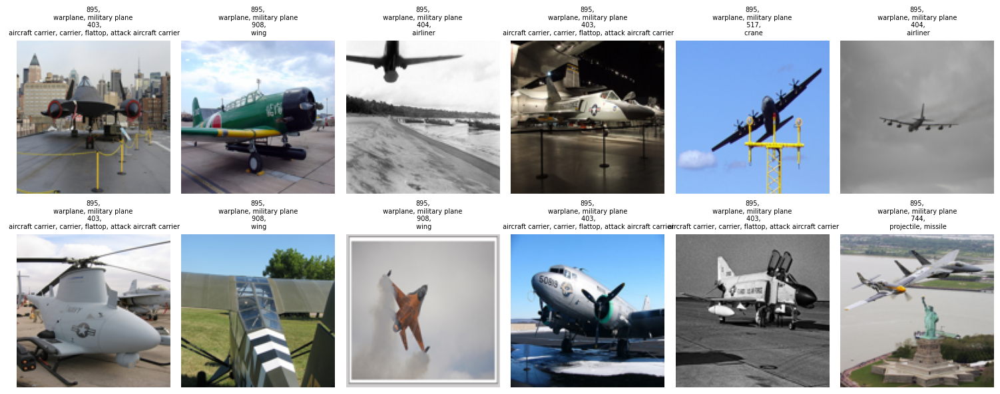

In [ ]:
import matplotlib.pyplot as plt
import math
new_warplane_dataframe = different_values_rows.iloc[:,:]

# Define the number of images to plot
num_images = len(new_warplane_dataframe)

# Calculate the grid size
num_cols = 6 # Number of columns you want to display
num_rows = math.ceil(num_images / num_cols)

# Set the target size for all images
target_size = (128, 128)  # Width, height

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop over each axis and plot the image, ensuring we don't go out of bounds
for idx, ax in enumerate(axes):
    if idx < len(new_warplane_dataframe):  # Check to avoid index out-of-range
        # Fetch image and resize
        image = new_warplane_dataframe.iloc[idx]['Images']
        image = image.resize(target_size)  # Resize image

        # Fetch labels
        true_label = new_warplane_dataframe.iloc[idx]['True Label']
        true_name = new_warplane_dataframe.iloc[idx]['True Label Name']
        predicted_label = new_warplane_dataframe.iloc[idx]['Predicted Label']
        predicted_label_name = new_warplane_dataframe.iloc[idx]['Predicted Label Name']

        # Display the image with title
        ax.imshow(image)
        ax.set_title(f"{true_label},\n {true_name} \n {predicted_label},\n {predicted_label_name}", fontsize=7)
        ax.axis('off')
    else:
        ax.axis('off')  # Hide any extra subplots

# Adjust spacing between columns
plt.subplots_adjust(wspace= .2, hspace= .7)
plt.tight_layout()
plt.savefig('different_data.png')
plt.show()


## Lime Explanation

In [ ]:
# Define the batch prediction function
def batch_predict(images):
    model.eval()
    inputs = processor(images=images, return_tensors='pt').to(device)
    with torch.no_grad():
        logits = model(**inputs).logits
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()


Lime explanation visualizations help to understand which parts of the image influence the model's decision, providing insights into the model's behavior for each input image.

1st Visualization: This section visualizes the LIME explanation with both positive and negative contributions of features shown. The image boundaries are highlighted based on the LIME mask.

2nd Visualization: This visualization shows only the features with positive contributions towards the predicted class, without hiding the rest of the image.

3rd Visualization: This variant highlights the positive features while hiding the rest of the image, focusing on the most influential regions.

4rth Visualization: This heatmap shows the weight of each segment (superpixel) in influencing the model's prediction. The colors represent the contribution of each segment, following this sequence: dark blue, blue, light blue, white, light orange, orange, dark orange, light red, red, dark red.

- Dark blue indicates the most influential parts contributing positively.

- White represents a neutral or average influence.

- Orange shades indicate moderate negative influences.

- Dark red shows the most negative contribution.

This sequence visually communicates how each part of the image impacts the model’s decision, from highly positive (dark blue) to highly negative (dark red).



### Unique Data Lime Explanation

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

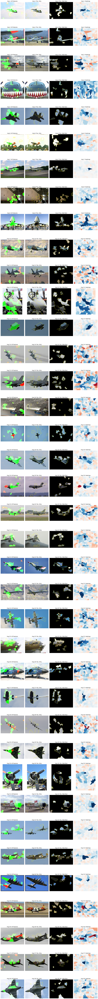

In [ ]:
# Determine the number of images to process
num_images = len(unique_values_rows['Images'])

# Create a figure and an array of subplots
fig, axs = plt.subplots(num_images, 4, figsize=(15, 4 * num_images)) # Create a grid of subplots

# Iterate over the dataset of 50 images
for i in range(len(unique_values_rows['Images'])):
    image = unique_values_rows['Images'].iloc[i]

    # Perform prediction
    test_pred = batch_predict(image)
    predicted_label = test_pred.squeeze().argmax()

    # Initialize the LIME explainer
    explainer = lime_image.LimeImageExplainer()

    # Generate explanation for the image
    explanation = explainer.explain_instance(
        np.array(image),
        batch_predict,  # Classification function
        top_labels=5,
        hide_color=0,
        num_samples= 300  # Number of images that will be sent to the classification function
    )

    # 1st Visualization: Original explanation with positive_only=False, hide_rest=False
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=False,
        num_features=10,
        hide_rest=False
    )
    img_boundary0 = mark_boundaries(temp / 255.0, mask)
    axs[i, 0].imshow(img_boundary0)
    axs[i, 0].set_title(f'Img {i+1}: All Features')
    axs[i, 0].axis('off')

    # 2nd Visualization: Positive explanation with positive_only=True, hide_rest=False
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=False
    )
    img_boundary1 = mark_boundaries(temp / 255.0, mask)
    axs[i, 1].imshow(img_boundary1)
    axs[i, 1].set_title(f'Img {i+1}: Pos. Only')
    axs[i, 1].axis('off')

    # 3rd Visualization: Positive explanation with positive_only=True, hide_rest=True
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=True
    )
    img_boundary2 = mark_boundaries(temp / 255.0, mask)
    axs[i, 2].imshow(img_boundary2)
    axs[i, 2].set_title(f'Img {i+1}: Pos. Hide Rest')
    axs[i, 2].axis('off')

    # 4th Visualization: Heatmap visualization
    ind = explanation.top_labels[0]
    dict_heatmap = dict(explanation.local_exp[ind])
    heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
    axs[i, 3].imshow(heatmap, cmap='RdBu', vmin=-heatmap.max(), vmax=heatmap.max())
    axs[i, 3].set_title(f'Img {i+1}: Heatmap')
    axs[i, 3].axis('off')

# Save the whole figure with all subplots
plt.tight_layout()
plt.savefig('lime_explanations_all_images.png', dpi=300, bbox_inches='tight')
plt.show()

### Distinct Data Lime Explanation

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

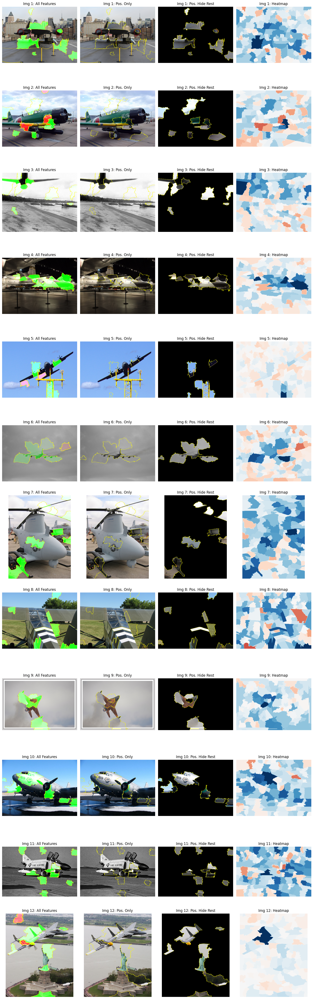

In [ ]:
# Determine the number of images to process
num_images = len(different_values_rows['Images'])

# Create a figure and an array of subplots
fig, axs = plt.subplots(num_images, 4, figsize=(15, 4 * num_images)) # Create a grid of subplots

# Iterate over the dataset of 50 images
for i in range(len(different_values_rows['Images'])):
    image = different_values_rows['Images'].iloc[i]

    # Perform prediction
    test_pred = batch_predict(image)
    predicted_label = test_pred.squeeze().argmax()

    # Initialize the LIME explainer
    explainer = lime_image.LimeImageExplainer()

    # Generate explanation for the image
    explanation = explainer.explain_instance(
        np.array(image),
        batch_predict,  # Classification function
        top_labels=5,
        hide_color=0,
        num_samples= 300  # Number of images that will be sent to the classification function
    )

    # 1st Visualization: Original explanation with positive_only=False, hide_rest=False
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=False,
        num_features=10,
        hide_rest=False
    )
    img_boundary0 = mark_boundaries(temp / 255.0, mask)
    axs[i, 0].imshow(img_boundary0)
    axs[i, 0].set_title(f'Img {i+1}: All Features')
    axs[i, 0].axis('off')

    # 2nd Visualization: Positive explanation with positive_only=True, hide_rest=False
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=False
    )
    img_boundary1 = mark_boundaries(temp / 255.0, mask)
    axs[i, 1].imshow(img_boundary1)
    axs[i, 1].set_title(f'Img {i+1}: Pos. Only')
    axs[i, 1].axis('off')

    # 3rd Visualization: Positive explanation with positive_only=True, hide_rest=True
    temp, mask = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=True
    )
    img_boundary2 = mark_boundaries(temp / 255.0, mask)
    axs[i, 2].imshow(img_boundary2)
    axs[i, 2].set_title(f'Img {i+1}: Pos. Hide Rest')
    axs[i, 2].axis('off')

    # 4th Visualization: Heatmap visualization
    ind = explanation.top_labels[0]
    dict_heatmap = dict(explanation.local_exp[ind])
    heatmap = np.vectorize(dict_heatmap.get)(explanation.segments)
    axs[i, 3].imshow(heatmap, cmap='RdBu', vmin=-heatmap.max(), vmax=heatmap.max())
    axs[i, 3].set_title(f'Img {i+1}: Heatmap')
    axs[i, 3].axis('off')

# Save the whole figure with all subplots
plt.tight_layout()
plt.savefig('lime_explanations_all_images_different_values.png', dpi=300, bbox_inches='tight')
plt.show()